# Network Visualisation of Singapore's Public Bus Transport System

First, to obtain the data set, we need to make API calls using the one provided for LTA's DataMall. 

In [1]:
import requests

In [ ]:
api_key = 'your_API_key'
base_url = 'the_URL_to_make_API_calls_on'

In [ ]:
headers = {
    'AccountKey' : api_key,
    'accept' : 'application/json'
}

In [ ]:
page = 1
all_values = []

while True:
    params = {
        '$skip': (page - 1)*500
    }
    response = requests.get(base_url, 
                            params = params,
                            headers = headers)
    print(f"extracting page {page}")
    values = response.json()['value']
    all_values.extend(values)
    if len(values) != 500:
        break
    page += 1

In [1]:
import pandas as pd 

In [9]:
file_name = pd.DataFrame(all_values)

NameError: name 'all_values' is not defined

In [10]:
# To convert to a csv file if required
file_name.to_csv("file_name.csv", index = False)

NameError: name 'file_name' is not defined

Next, to sort the obtained data set: 
First, import the origin destination trip records,

In [2]:
od_three_months = pd.read_csv('od_three_months.csv',\
                usecols=['ORIGIN_PT_CODE', 'DESTINATION_PT_CODE', 'TOTAL_TRIPS'])

od_three_months['ORIGIN_PT_CODE'] = od_three_months['ORIGIN_PT_CODE'].astype("str").str.zfill(5)
od_three_months['DESTINATION_PT_CODE'] = od_three_months['DESTINATION_PT_CODE'].astype("str").str.zfill(5)

Since we have three months worth of data, it is easier to analyse it when the data is combined as a whole. 
The `.groupby` method takes in an attribute, and groups the data according to the categories, then applies a function to the category. 

In [3]:
od_modified = od_three_months.groupby(['ORIGIN_PT_CODE', 'DESTINATION_PT_CODE'])['TOTAL_TRIPS'].sum()

In [4]:
od_stops = od_modified.reset_index()

In [5]:
od_stops.head()

,ORIGIN_PT_CODE,DESTINATION_PT_CODE,TOTAL_TRIPS
0,01012,01112,4821
1,01012,01113,3660
2,01012,01121,2306
3,01012,01211,3432
4,01012,01311,5780


Next, import the bus stop data. 

In [6]:
bus_stops = pd.read_csv('bus_stops.csv')
bus_stops["BusStopCode"] = bus_stops["BusStopCode"].astype("str").str.zfill(5)
bus_stops.head(5)

,BusStopCode,RoadName,Description,Latitude,Longitude
0,01012,Victoria St,Hotel Grand Pacific,1.296848,103.852536
1,01013,Victoria St,St. Joseph's Ch,1.297710,103.853225
2,01019,Victoria St,Bras Basah Cplx,1.296990,103.853022
3,01029,Nth Bridge Rd,Opp Natl Lib,1.296673,103.854414
4,01039,Nth Bridge Rd,Bugis Cube,1.298208,103.855491


For a more comprehensive overview of where the bus stops are located, we will require the subzone name and region of each bus stop. 

In [7]:
import geopandas as gpd
import numpy as np 
import matplotlib.pyplot as plt

/Library/Frameworks/Python.framework/Versions/3.9/lib/python3.9/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.9.1-CAPI-1.14.2). Conversions between both will be slow.
  warnings.warn(


In [8]:
geo_df = gpd.read_file('MP19_SZ_No_Sea/URA_MP19_SUBZONE_NO_SEA_PL.shp')

In [9]:
geo_df_reproj = geo_df.to_crs(3857)

In [10]:
geo_df_reproj.columns

Index(['SUBZONE_NO', 'SUBZONE_N', 'SUBZONE_C', 'CA_IND', 'PLN_AREA_N',
       'PLN_AREA_C', 'REGION_N', 'REGION_C', 'INC_CRC', 'FMEL_UPD_D',
       'geometry'],
      dtype='object')

In [11]:
from shapely.geometry import Point
# Creating a point geometry column
bus_stops['geometry'] = bus_stops.apply(lambda x: Point((x.Longitude, x.Latitude)),
                                       axis = 1)

In [12]:
# Create a GeoDataFrame from the original bus_stops DataFrame
bus_stops_geo = gpd.GeoDataFrame(bus_stops, 
                                 crs = "epsg:4326",
                                 geometry = bus_stops.geometry)
bus_stops_geo_reproj = bus_stops_geo.to_crs(3857)

In [13]:
joined_gdf = gpd.sjoin(bus_stops_geo_reproj, 
                       geo_df_reproj, 
                       how = 'left')

As I will only require the BusStopCode, Subzone Name and Region Name, the geo_df obtained needs to be subset by columns. 
I will also need to convert the subsequent GeoDataFrame into a DataFrame. 

In [14]:
joined_gdf.columns

Index(['BusStopCode', 'RoadName', 'Description', 'Latitude', 'Longitude',
       'geometry', 'index_right', 'SUBZONE_NO', 'SUBZONE_N', 'SUBZONE_C',
       'CA_IND', 'PLN_AREA_N', 'PLN_AREA_C', 'REGION_N', 'REGION_C', 'INC_CRC',
       'FMEL_UPD_D'],
      dtype='object')

In [15]:
# Subset the current joined geo_df to get the columns I need.
required_bus_stops = joined_gdf[['BusStopCode', 'SUBZONE_N', 'PLN_AREA_N', 'REGION_N']]
required_bus_stops.head()

,BusStopCode,SUBZONE_N,PLN_AREA_N,REGION_N
0,01012,VICTORIA,ROCHOR,CENTRAL REGION
1,01013,VICTORIA,ROCHOR,CENTRAL REGION
2,01019,BUGIS,DOWNTOWN CORE,CENTRAL REGION
3,01029,BUGIS,DOWNTOWN CORE,CENTRAL REGION
4,01039,BUGIS,DOWNTOWN CORE,CENTRAL REGION


In [16]:
bus_stops_df = pd.DataFrame(required_bus_stops)

In [17]:
# To join the 2 datasets we have obtained:
od_stops = pd.merge(od_stops, bus_stops_df,\
                    how = 'left', left_on ='ORIGIN_PT_CODE', right_on = 'BusStopCode')
od_stops = pd.merge(od_stops, bus_stops_df,\
             how = 'left', left_on = 'DESTINATION_PT_CODE', right_on = 'BusStopCode')
od_stops.head(10)

,ORIGIN_PT_CODE,DESTINATION_PT_CODE,TOTAL_TRIPS,BusStopCode_x,SUBZONE_N_x,PLN_AREA_N_x,REGION_N_x,BusStopCode_y,SUBZONE_N_y,PLN_AREA_N_y,REGION_N_y
0,01012,01112,4821,01012,VICTORIA,ROCHOR,CENTRAL REGION,01112,VICTORIA,ROCHOR,CENTRAL REGION
1,01012,01113,3660,01012,VICTORIA,ROCHOR,CENTRAL REGION,01113,BUGIS,DOWNTOWN CORE,CENTRAL REGION
2,01012,01121,2306,01012,VICTORIA,ROCHOR,CENTRAL REGION,01121,ROCHOR CANAL,ROCHOR,CENTRAL REGION
3,01012,01211,3432,01012,VICTORIA,ROCHOR,CENTRAL REGION,01211,CRAWFORD,KALLANG,CENTRAL REGION
4,01012,01311,5780,01012,VICTORIA,ROCHOR,CENTRAL REGION,01311,LAVENDER,KALLANG,CENTRAL REGION
5,01012,01549,22,01012,VICTORIA,ROCHOR,CENTRAL REGION,01549,KAMPONG GLAM,ROCHOR,CENTRAL REGION
6,01012,01559,78,01012,VICTORIA,ROCHOR,CENTRAL REGION,01559,KAMPONG GLAM,ROCHOR,CENTRAL REGION
7,01012,07371,227,01012,VICTORIA,ROCHOR,CENTRAL REGION,07371,LAVENDER,KALLANG,CENTRAL REGION
8,01012,60011,321,01012,VICTORIA,ROCHOR,CENTRAL REGION,60011,KALLANG BAHRU,KALLANG,CENTRAL REGION
9,01012,60021,343,01012,VICTORIA,ROCHOR,CENTRAL REGION,60021,KALLANG BAHRU,KALLANG,CENTRAL REGION


In [18]:
# rename the df for easier use
final_df = od_stops

In [19]:
final_df.shape

(372020, 11)

A couple of test cases to visualise how to obtain the general graph object function. 

In [20]:
import seaborn as sns

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
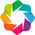

In [23]:
from holoviews import opts, dim
import holoviews as hv

hv.extension('bokeh')
hv.output(size=200)

## Filtering the dataframe
The function `filter_trips()` below allows us to easily filter the data frame we are working on, to obtain a subset of the data set.  

In [36]:
def filter_trips(od_stops,
                 level, # 'SUBZONE', 'PLN_AREA', 'REGION'
                 selected_origin, # ['VICTORIA']
                 selected_dest, # 'all' OR ['CHONG BOON', 'CHONG PANG']
                 min_trips): # 5000
    '''
    Filters the origin-destination dataframe for selected origin-destination pairs
    and for a minimum number of trips.

    Args:
        od_stops: Pandas dataframe of all origin-destination bus stops and trip numbers
        level: Which geospatial level to filter at (subzone, planning area, or region)
        selected_origin: The origin area(s) in the level selected 
        selected_dest: The destination area(s) in the level selected
        min_trips: integer value of the minimum number of trips to be filtered
    Returns:
        What do you return? Pandas dataframe which is filtered
    Raises:
        AssertionError: For incorrect inputs
    '''

    # Check that the level that was passed in is correct
    if level not in ['SUBZONE', 'PLN_AREA', 'REGION']:
        raise AssertionError("Error! Please key in a correct level.")

    # Check that there is some selection
    if len(selected_origin) == 0:
        raise AssertionError("Error! Please select at least one origin.")
    if len(selected_dest) == 0:
        raise AssertionError("Error! Please select at least one destination.")

    # Check that min_trips is at least 1
    if min_trips < 0:
        raise AssertionError("Error! Please key in a positive integer value \
                                to be the minimum number of trips.")
        
    def generate_boolean_mask(df, level, origin_dest, selected):
        if selected == 'all':
            boolean_mask = ~df[f'{level}_N_{origin_dest}'].isin([])
        else:
            boolean_mask = df[f'{level}_N_{origin_dest}'].isin(selected)
        return boolean_mask

    boolean_mask_origin = generate_boolean_mask(od_stops,
                                           level,
                                           "x",
                                           selected_origin)

    boolean_mask_dest = generate_boolean_mask(od_stops,
                                           level,
                                           "y",
                                           selected_dest)

    boolean_mask_mintrips = od_stops['TOTAL_TRIPS'] >= min_trips

    output = od_stops[boolean_mask_origin & boolean_mask_dest & boolean_mask_mintrips].reset_index(drop = True)

    return output

In [37]:
filter_trips(final_df, 'SUBZONE', ['VICTORIA'], ['BUGIS'], 5)

,ORIGIN_PT_CODE,DESTINATION_PT_CODE,TOTAL_TRIPS,BusStopCode_x,SUBZONE_N_x,PLN_AREA_N_x,REGION_N_x,BusStopCode_y,SUBZONE_N_y,PLN_AREA_N_y,REGION_N_y
0,01012,01113,3660,01012,VICTORIA,ROCHOR,CENTRAL REGION,01113,BUGIS,DOWNTOWN CORE,CENTRAL REGION
1,01013,01113,617,01013,VICTORIA,ROCHOR,CENTRAL REGION,01113,BUGIS,DOWNTOWN CORE,CENTRAL REGION
2,07518,01511,440,07518,VICTORIA,ROCHOR,CENTRAL REGION,01511,BUGIS,DOWNTOWN CORE,CENTRAL REGION
3,07518,01621,411,07518,VICTORIA,ROCHOR,CENTRAL REGION,01621,BUGIS,DOWNTOWN CORE,CENTRAL REGION
4,07518,01639,1699,07518,VICTORIA,ROCHOR,CENTRAL REGION,01639,BUGIS,DOWNTOWN CORE,CENTRAL REGION
5,07569,01511,227,07569,VICTORIA,ROCHOR,CENTRAL REGION,01511,BUGIS,DOWNTOWN CORE,CENTRAL REGION
6,07569,01621,130,07569,VICTORIA,ROCHOR,CENTRAL REGION,01621,BUGIS,DOWNTOWN CORE,CENTRAL REGION
7,07569,01639,415,07569,VICTORIA,ROCHOR,CENTRAL REGION,01639,BUGIS,DOWNTOWN CORE,CENTRAL REGION


# Generating the chord diagram

In [98]:
# Shaun's function for generating the chord diagram data

pd.options.mode.chained_assignment = None

selected_towns = ['BUKIT BATOK', 'CLEMENTI', 'JURONG EAST']
def generate_chord_diagram(final_df, areas):
    
    # Filter the data for only the areas we have selected
    selected_areas_df = final_df[final_df['PLN_AREA_N_x'].isin(areas) & final_df['PLN_AREA_N_y'].isin(areas)]
    
    # Filter the data for the rest of the trips
    other_areas_df = final_df[(final_df['PLN_AREA_N_x'].isin(areas) & ~final_df['PLN_AREA_N_y'].isin(areas)) | (~final_df['PLN_AREA_N_x'].isin(areas) & final_df['PLN_AREA_N_y'].isin(areas))]
    
    # Convert the other non-selected towns into "OTHERS"
    other_areas_df['PLN_AREA_N_x'] = [pln_area if pln_area in areas else 'ZZOTHERS' for pln_area in other_areas_df['PLN_AREA_N_x']]
    other_areas_df['PLN_AREA_N_y'] = [pln_area if pln_area in areas else 'ZZOTHERS' for pln_area in other_areas_df['PLN_AREA_N_y']]
    
    # Add them all back together
    limited_areas_df = pd.concat([selected_areas_df, other_areas_df], ignore_index = True)
    
    # Group by the planning area and sum the total trips
    trips2 = limited_areas_df.groupby(['PLN_AREA_N_x', 'PLN_AREA_N_y'])['TOTAL_TRIPS'].sum()
    links2 = pd.DataFrame.from_records(list(trips2.index), columns = ['start', 'end'])
    links2['trips'] = trips2.values
    
    links2['set'] = ''
    for i in range(len(links2)):
        links2['set'][i] = ','.join(sorted([links2['start'][i], links2['end'][i]]))
    chord_df = links2.groupby('set')['trips'].sum().reset_index()
    chord_final = pd.concat([chord_df, chord_df['set'].str.split(',', expand = True)], axis = 1)
    chord_final.drop('set', inplace = True, axis = 1)
    chord_final.columns = ['value', 'source', 'target']
    chord_final['source'] = chord_final['source'].replace({k:str(i) for i,k in enumerate(selected_towns)}).replace({'ZZOTHERS': len(selected_towns)}).astype('int32')
    chord_final['target'] = chord_final['target'].replace({k:str(i) for i,k in enumerate(selected_towns)}).replace({'ZZOTHERS': len(selected_towns)}).astype('int32')
    
    nodes = hv.Dataset(pd.DataFrame(selected_towns + ['OTHERS'], columns = ['name']), 'index')
    
    return nodes, chord_final.loc[:,['source', 'target', 'value']]

In [105]:
# adapted version of Shaun's function for generating the chord diagram data
# i was trying to isolate the dataframe we get before it is moulded into the one for creating the chord diagram, but doing this did not help HAHA

pd.options.mode.chained_assignment = None

selected_towns = ['BUKIT BATOK', 'CLEMENTI', 'JURONG EAST']
def df_chord(final_df, areas):
    # Filter the data for only the areas we have selected
    selected_areas_df = final_df[final_df['PLN_AREA_N_x'].isin(areas) & final_df['PLN_AREA_N_y'].isin(areas)]
    
    # Filter the data for the rest of the trips
    other_areas_df = final_df[(final_df['PLN_AREA_N_x'].isin(areas) & ~final_df['PLN_AREA_N_y'].isin(areas)) | (~final_df['PLN_AREA_N_x'].isin(areas) & final_df['PLN_AREA_N_y'].isin(areas))]
    
    # Convert the other non-selected towns into "OTHERS"
    other_areas_df['PLN_AREA_N_x'] = [pln_area if pln_area in areas else 'ZZOTHERS' for pln_area in other_areas_df['PLN_AREA_N_x']]
    other_areas_df['PLN_AREA_N_y'] = [pln_area if pln_area in areas else 'ZZOTHERS' for pln_area in other_areas_df['PLN_AREA_N_y']]
    
    # Add them all back together
    limited_areas_df = pd.concat([selected_areas_df, other_areas_df], ignore_index = True)
    
    # Group by the planning area and sum the total trips
    trips2 = limited_areas_df.groupby(['PLN_AREA_N_x', 'PLN_AREA_N_y'])['TOTAL_TRIPS'].sum()
    links2 = pd.DataFrame.from_records(list(trips2.index), columns = ['start', 'end'])
    links2['trips'] = trips2.values
    links2['set'] = ''
    
    return links2

def generate_chord_diagram(links2):
    for i in range(len(links2)):
        links2['set'][i] = ','.join(sorted([links2['start'][i], links2['end'][i]]))
    chord_df = links2.groupby('set')['trips'].sum().reset_index()
    chord_final = pd.concat([chord_df, chord_df['set'].str.split(',', expand = True)], axis = 1)
    chord_final.drop('set', inplace = True, axis = 1)
    chord_final.columns = ['value', 'source', 'target']
    chord_final['source'] = chord_final['source'].replace({k:str(i) for i,k in enumerate(selected_towns)}).replace({'ZZOTHERS': len(selected_towns)}).astype('int32')
    chord_final['target'] = chord_final['target'].replace({k:str(i) for i,k in enumerate(selected_towns)}).replace({'ZZOTHERS': len(selected_towns)}).astype('int32')
    
    nodes = hv.Dataset(pd.DataFrame(selected_towns + ['OTHERS'], columns = ['name']), 'index')
    
    return nodes, chord_final.loc[:,['source', 'target', 'value']]

In [106]:
chord.opts.get()

Options(axiswise=False, cmap='Category10', edge_cmap='Category10', edge_color=dim('source').astype(<class 'str'>), edge_hover_line_color='limegreen', edge_line_color='black', edge_line_width=1, edge_nonselection_alpha=0.1, edge_nonselection_line_color='black', edge_selection_line_color='limegreen', framewise=False, label_text_font_size='8pt', labels='name', node_color=dim('index').astype(<class 'str'>), node_hover_fill_color='limegreen', node_hover_line_color='black', node_line_color='black', node_nonselection_alpha=0.2, node_nonselection_fill_color=Cycle(), node_nonselection_line_color='black', node_selection_fill_color='limegreen', node_selection_line_color='black', node_size=15, tools=[HoverTool(id='3855', ...)], xaxis=None, yaxis=None)

Note that this function ensures that:
* Trips are summed bidirectionally (ie it doesn't matter if it's A -> B or B -> A, we sum the traffic both ways.
* `OTHERS` will always be the last category, regardless of how many towns you pass in. The links will also never be coloured with the `OTHERS` colour.

In [112]:
selected_towns = ['BUKIT BATOK', 'CLEMENTI', 'JURONG EAST']
nodes, links = generate_chord_diagram(df_chord(final_df, selected_towns))

In [116]:
df_chord(final_df, selected_towns)

,start,end,trips,set
0,BUKIT BATOK,BUKIT BATOK,5133020,
1,BUKIT BATOK,CLEMENTI,325706,
2,BUKIT BATOK,JURONG EAST,718795,
3,BUKIT BATOK,ZZOTHERS,2169735,
4,CLEMENTI,BUKIT BATOK,354443,
5,CLEMENTI,CLEMENTI,3790163,
6,CLEMENTI,JURONG EAST,929511,
7,CLEMENTI,ZZOTHERS,2273517,
8,JURONG EAST,BUKIT BATOK,541139,
9,JURONG EAST,CLEMENTI,859671,


In [120]:
from bokeh.models import HoverTool, ColumnDataSource
source = ColumnDataSource(df_chord(final_df, selected_towns)) # this input is probably wrong
tooltips = [ ('Source', '@start'), ('Target', '@end'), ('Value', '@trips')]
hover = HoverTool(tooltips = tooltips)

In [124]:
chord = hv.Chord((links, nodes)).select(value=(5, None))
chord.opts(tools=[hover], node_color=dim('index').str(),
           edge_color=dim('source').str(),
           labels='name', 
           cmap='Category10',
           edge_cmap='Category10')

:Chord   [source,target]   (value)

In [56]:
selected_towns = ['BISHAN', 'TOA PAYOH', 'NOVENA']
nodes, links = generate_chord_diagram(final_df, selected_towns)
chord = hv.Chord((links, nodes))
chord.opts(node_color=dim('index').str(),
           edge_color=dim('source').str(),
           labels='name', 
           cmap='Category10',
           edge_cmap='Category10')

:Chord   [source,target]   (value)

In [68]:
selected_towns = ['TAMPINES', 'BEDOK', 'PASIR RIS']
nodes, links = generate_chord_diagram(final_df, selected_towns)
chord = hv.Chord((links, nodes))
chord.opts(
    opts.Chord(node_color=dim('index').str(),
           edge_color=dim('source').str(),
           labels='name', 
           cmap='Category10',
           edge_cmap='Category10'))

:Chord   [source,target]   (value)

In [58]:
selected_towns = ['WOODLANDS', 'MANDAI', 'SEMBAWANG', 'YISHUN']
nodes, links = generate_chord_diagram(final_df, selected_towns)
chord = hv.Chord((links, nodes))
chord.opts(node_color=dim('index').str(),
           edge_color=dim('source').str(),
           labels='name', 
           cmap='Category10',
           edge_cmap='Category10')

:Chord   [source,target]   (value)

## Formatting the Data:
After obtaining the filtered dataframe, we need to transform the filtered dataframe into one that can be used for visualisation. 

We will only require BusStopCode_x, BusStopCode_y, as well as the origin and destination level that was previously selected. 

In [59]:
def format_df(filtered_df, level):

    cols = ['BusStopCode_x', 'BusStopCode_y', f"{level}_N_x", f"{level}_N_y", 'TOTAL_TRIPS']
    
    required = filtered_df[cols]
    
    output = required.rename(columns = {"BusStopCode_x" : "START", "BusStopCode_y" : "END", "TOTAL_TRIPS" : "WEIGHT"})
    # output['WEIGHT_INV'] = 1/output.WEIGHT
    
    return output

In [39]:
desired_df = format_df(filter_trips(final_df, 'PLN_AREA', ['CLEMENTI'], ['JURONG EAST'], 5), 'PLN_AREA')
desired_df

,START,END,PLN_AREA_N_x,PLN_AREA_N_y,WEIGHT
0,12201,28299,CLEMENTI,JURONG EAST,2376
1,12201,28451,CLEMENTI,JURONG EAST,691
2,12201,28461,CLEMENTI,JURONG EAST,637
3,12201,28491,CLEMENTI,JURONG EAST,372
4,16131,28009,CLEMENTI,JURONG EAST,21
...,...,...,...,...,...
988,28709,28211,CLEMENTI,JURONG EAST,2012
989,28709,28319,CLEMENTI,JURONG EAST,334
990,28709,28449,CLEMENTI,JURONG EAST,248
991,28709,28639,CLEMENTI,JURONG EAST,655


## Visualisation of Data 
1) Network Graph

In [40]:
import community
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

In [41]:
G = nx.from_pandas_edgelist(desired_df, 
                           source = "START",
                           target = "END",
                           edge_attr = "WEIGHT")

In [42]:
# Labelling of nodes
for node in G.nodes():
    G.nodes()[node]["label"] = str(node)

In [43]:
G.nodes(data = True)

# Store subzone/planning area/region in nodes, 
# number of trips in edges

NodeDataView({'12201': {'label': '12201'}, '28299': {'label': '28299'}, '28451': {'label': '28451'}, '28461': {'label': '28461'}, '28491': {'label': '28491'}, '16131': {'label': '16131'}, '28009': {'label': '28009'}, '28041': {'label': '28041'}, '28211': {'label': '28211'}, '28319': {'label': '28319'}, '28621': {'label': '28621'}, '28639': {'label': '28639'}, '28649': {'label': '28649'}, '28659': {'label': '28659'}, '16141': {'label': '16141'}, '28449': {'label': '28449'}, '16151': {'label': '16151'}, '17009': {'label': '17009'}, '28051': {'label': '28051'}, '28061': {'label': '28061'}, '28071': {'label': '28071'}, '28081': {'label': '28081'}, '28281': {'label': '28281'}, '17011': {'label': '17011'}, '20121': {'label': '20121'}, '20129': {'label': '20129'}, '20141': {'label': '20141'}, '20151': {'label': '20151'}, '20161': {'label': '20161'}, '20171': {'label': '20171'}, '20189': {'label': '20189'}, '20199': {'label': '20199'}, '20201': {'label': '20201'}, '20211': {'label': '20211'}, 

In [44]:
G.edges()

EdgeView([('12201', '28299'), ('12201', '28451'), ('12201', '28461'), ('12201', '28491'), ('28299', '17151'), ('28299', '17161'), ('28299', '17171'), ('28299', '17181'), ('28299', '17371'), ('28451', '17009'), ('28451', '17121'), ('28451', '17131'), ('28451', '17141'), ('28451', '17151'), ('28451', '17161'), ('28451', '17171'), ('28451', '17181'), ('28451', '17371'), ('28451', '20011'), ('28451', '20021'), ('28451', '20031'), ('28451', '20101'), ('28451', '28011'), ('28451', '28021'), ('28451', '28031'), ('28461', '17009'), ('28461', '17121'), ('28461', '17131'), ('28461', '17141'), ('28461', '17151'), ('28461', '17161'), ('28461', '17171'), ('28461', '17181'), ('28461', '17371'), ('28461', '20011'), ('28461', '20021'), ('28461', '20031'), ('28461', '20101'), ('28461', '28011'), ('28461', '28021'), ('28461', '28031'), ('28491', '17009'), ('28491', '17121'), ('28491', '17131'), ('28491', '17141'), ('28491', '17151'), ('28491', '17161'), ('28491', '17171'), ('28491', '17181'), ('28491', 

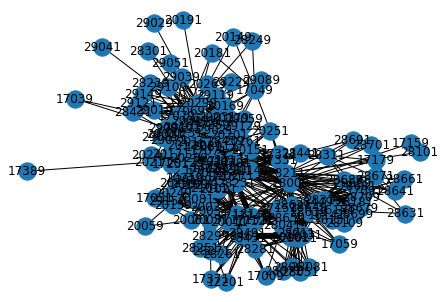

In [45]:
# pos = nx.spring_layout(G)

nx.draw(G, with_labels = True)

2) Chord Diagram

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
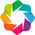

In [46]:
import numpy as np
import pandas as pd
import networkx as nx
from holoviews import opts, dim
import holoviews as hv

hv.extension('bokeh')
hv.output(size=200)

In [47]:
links = desired_df
links['trips'] = desired_df.WEIGHT

links.head()

,START,END,PLN_AREA_N_x,PLN_AREA_N_y,WEIGHT,trips
0,12201,28299,CLEMENTI,JURONG EAST,2376,2376
1,12201,28451,CLEMENTI,JURONG EAST,691,691
2,12201,28461,CLEMENTI,JURONG EAST,637,637
3,12201,28491,CLEMENTI,JURONG EAST,372,372
4,16131,28009,CLEMENTI,JURONG EAST,21,21


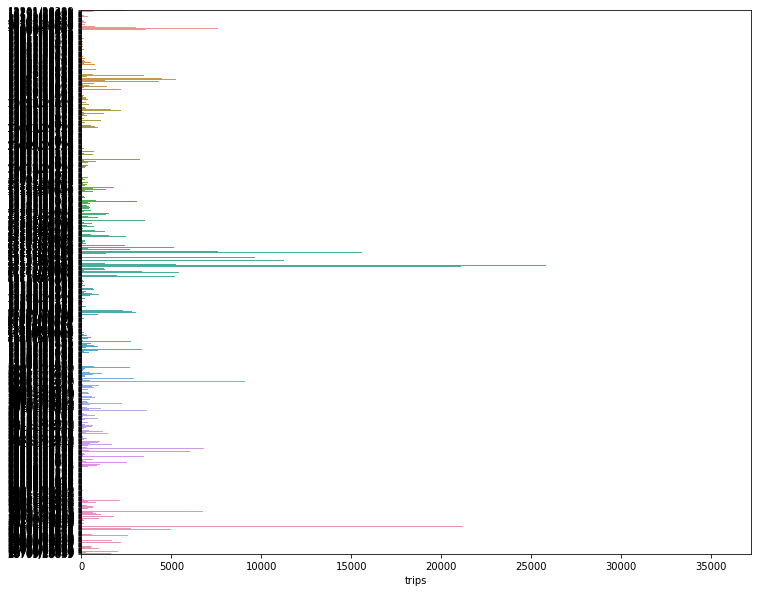

In [48]:
names = links.START + '/' + links.END
plt.figure(figsize=(12,10))
sns.barplot( x=links.trips[:], y=names[:], orient="h") ;

In [49]:
chord=hv.Chord(links[:])
chord.opts(node_color= 'index', edge_color='START',\
          label_index='index', cmap='Category10', edge_cmap='Category10')

:Chord   [START,END]   (PLN_AREA_N_x,PLN_AREA_N_y,WEIGHT,trips)

`pd.DataFrame.from_records()` creates a DataFrame obj from a structured ndarray, seq of tuples/dicts, or DataFrame.

In [50]:
links = pd.DataFrame.from_records(list(trips.index),\
                                 columns = ['start', 'end'])
links['trips'] = trips.values

links.head()

,start,end,trips
0,TOH TUCK,TOH TUCK,144
1,CLEMENTI WEST,CLEMENTI WEST,78
2,CLEMENTI CENTRAL,CLEMENTI CENTRAL,74
3,TOH TUCK,CLEMENTI NORTH,71
4,CLEMENTI NORTH,CLEMENTI NORTH,71


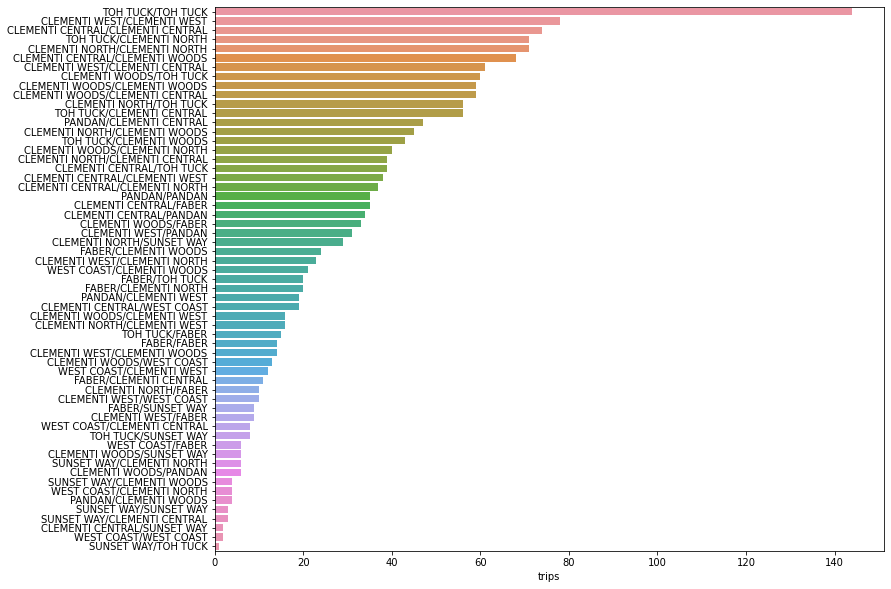

In [51]:
names = links.start + '/' + links.end
plt.figure(figsize=(12,10))
sns.barplot( x=links.trips[:], y=names[:], orient="h") ;

In [52]:
chord=hv.Chord(links[:60])
chord.opts(node_color='index', edge_color='start',\
          label_index='index', cmap='Category10', edge_cmap='Category10')

:Chord   [start,end]   (trips)

# Analysing the data
## Evaluation Points
1) Area with the greatest volume of passenger flow (?) -- assumed to be the town area/jurong industrial area
2) Bus stop density (within subzones? if it's too narrow then perhaps within a planning area?)
3) Which bus services are under/overused?
4) Which subzones have the fewest number of bus stops, and how will people access those subzones, if not by bus?
5) Are there many bus routes that overlap, and if so, is the passenger volume evenly distributed over them?
